In [ ]:
# ! pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118 && \
# ! pip install torch_scatter torch_sparse torch_cluster torch_spline_conv -f https://data.pyg.org/whl/torch-2.0.0+cu118.html && \
# ! pip install torch_geometric tiatoolbox opencv-python scikit-image matplotlib networkx seaborn numpy pandas

In [1]:
import os
import json
import cv2
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATv2Conv, global_mean_pool
from torch_geometric.data import Data
import torchvision.models as models
from skimage import measure
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial import distance
import shutil
import tiatoolbox.models
from tiatoolbox.models import NucleusInstanceSegmentor

|2025-07-01|23:22:42.548| [WARNING] /home/rudra/miniconda3/envs/histographs/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm

|2025-07-01|23:22:44.621| [WARNING] /home/rudra/miniconda3/envs/histographs/lib/python3.10/site-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.8 (you have 1.4.21). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()



In [2]:

# See all available names in the models module
print(dir(tiatoolbox.models))

['DeepFeatureExtractor', 'HoVerNet', 'HoVerNetPlus', 'IDaRS', 'IOPatchPredictorConfig', 'IOSegmentorConfig', 'MapDe', 'MicroNet', 'MultiTaskSegmentor', 'NuClick', 'NucleusInstanceSegmentor', 'PatchDataset', 'PatchPredictor', 'SCCNN', 'SemanticSegmentor', 'WSIPatchDataset', 'WSIStreamDataset', '__all__', '__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__path__', '__spec__', 'architecture', 'dataset', 'engine', 'models_abc']


In [3]:
type_colors = {
    0: 'blue',
    1: 'yellow',
    2: 'red',
    3: 'black',
    4: 'green',
    5: 'aqua'
}


In [ ]:

# def segment_nuclei(patch_dir="./patches/", output_dir="./results/"):
    
# segment_nuclei()

In [4]:
import multiprocessing

# Get total number of available CPU cores
num_cpu_cores = multiprocessing.cpu_count()
print(f"Total CPU cores available: {num_cpu_cores}")


Total CPU cores available: 28


In [5]:
segmentor = NucleusInstanceSegmentor(
        pretrained_model="hovernet_fast-pannuke",  # Pretrained
        num_loader_workers=14,  # Adjust based on your system
        batch_size=1
    )


|2025-07-01|23:23:00.475| [WARNING] /home/rudra/miniconda3/envs/histographs/lib/python3.10/site-packages/tiatoolbox/models/architecture/__init__.py:149: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to thi

In [ ]:
! pip install natsort

In [6]:
import torch

# Check if CUDA is available
print("CUDA Available:", torch.cuda.is_available())

# Number of GPUs
print("Number of GPUs:", torch.cuda.device_count())

# GPU Name (if available)
if torch.cuda.is_available():
    print("GPU Name:", torch.cuda.get_device_name(0))


CUDA Available: True
Number of GPUs: 1
GPU Name: NVIDIA GeForce RTX 3050


In [ ]:
import os
from glob import glob
from natsort import natsorted

# Set base directories
input_base = "./dataset/data/Photos/"
output_base = "./n_detected_sg/"


# List subfolders in dataset directory
subfolders = [f for f in os.listdir(input_base)
              if os.path.isdir(os.path.join(input_base, f))]

for folder in subfolders:
    input_dir = os.path.join(input_base, folder)
    output_dir = os.path.join(output_base, folder)
    # os.makedirs(output_dir, exist_ok=True)

    # Get all .tif files in the current subfolder
    tif_files = natsorted(glob(os.path.join(input_dir, "*.tif")))
    print(tif_files)
    print(f"📁 Running on {folder} — {len(tif_files)} files")

    try:
        output = segmentor.predict(
            tif_files,
            save_dir=output_dir,
            mode="tile",
            device="cuda",
            resolution=0.42,
            units="micron",
            crash_on_exception=True
        )
        print(f"✅ Done with {folder}")
    except Exception as e:
        
        print(f"❌ Error processing {folder}: {e}")


In [ ]:
! pip install joblib


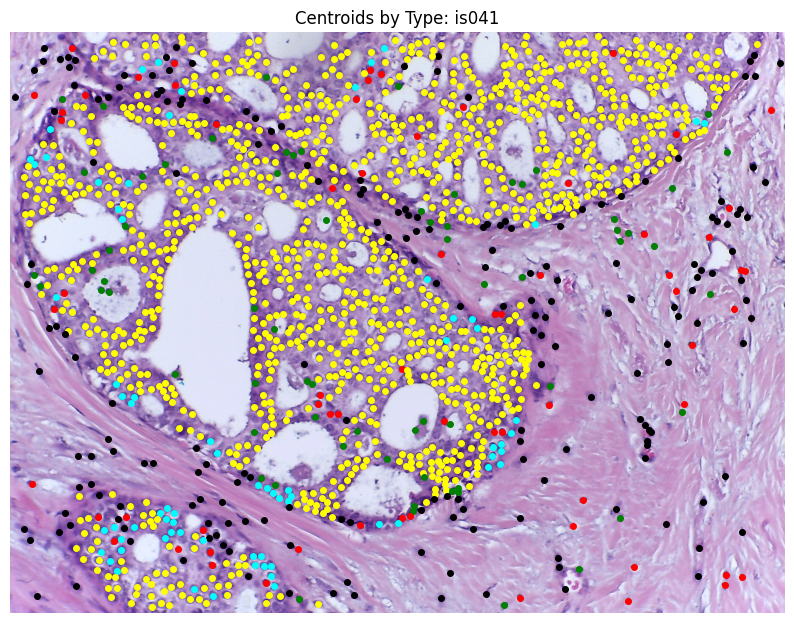

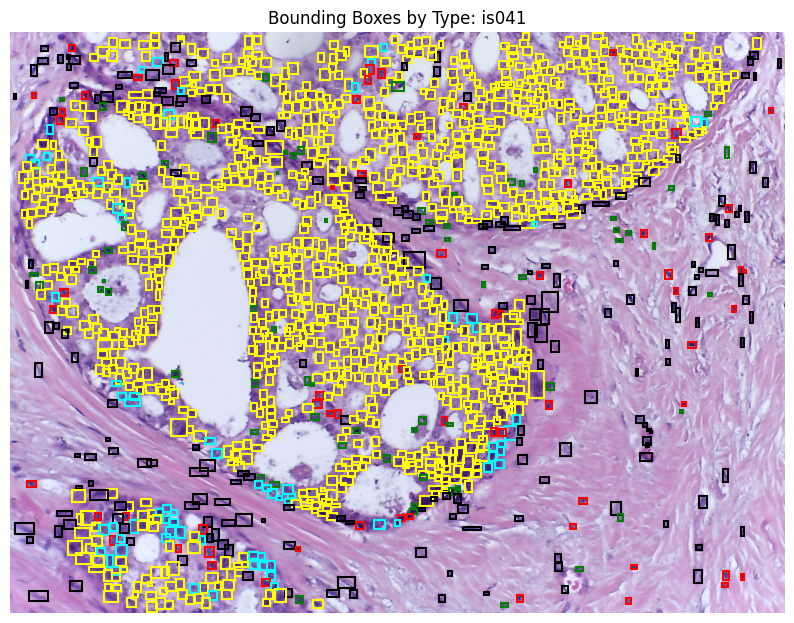

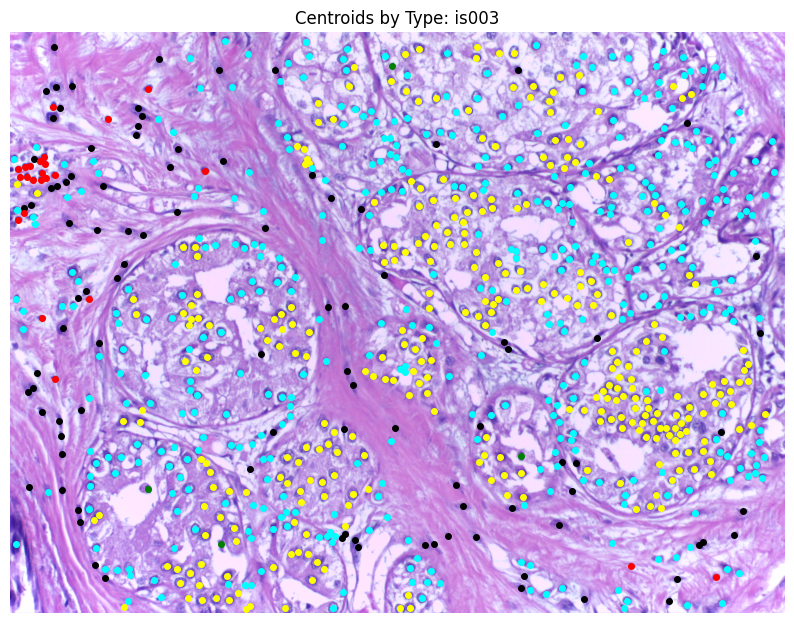

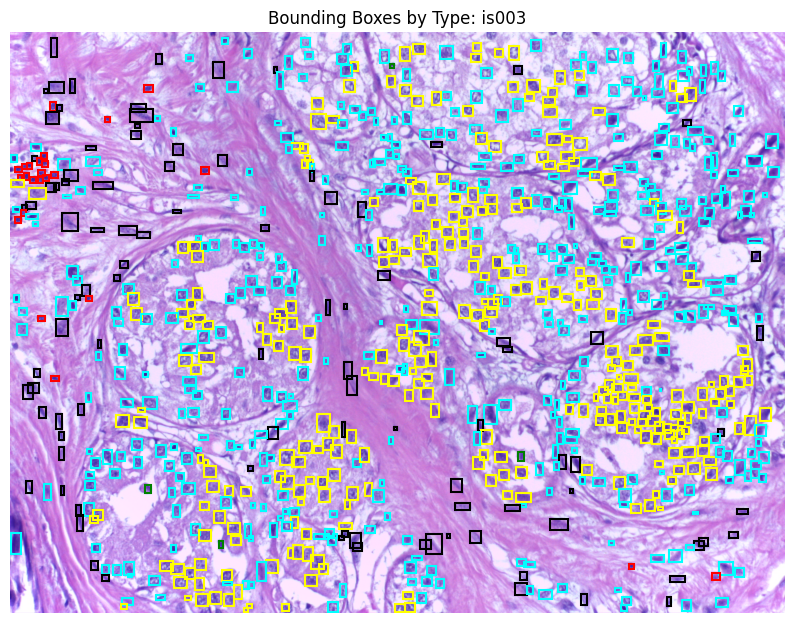

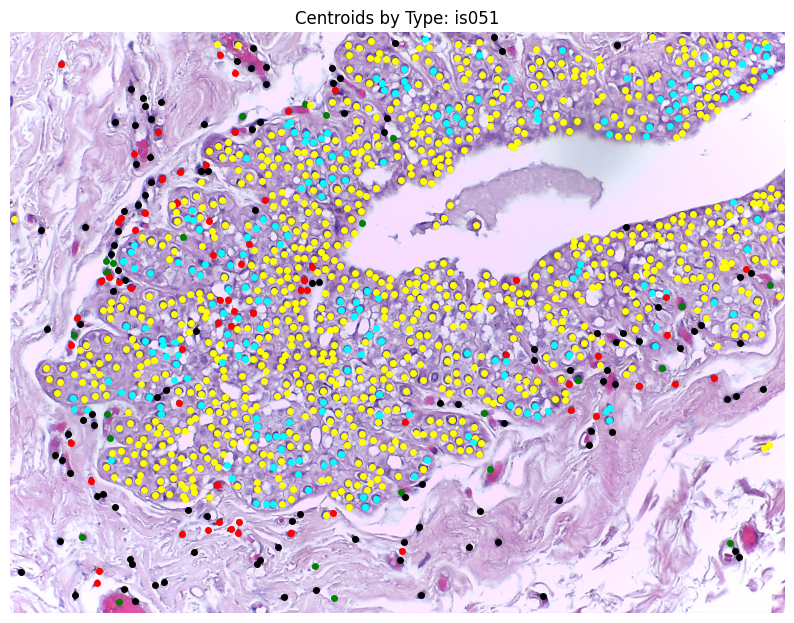

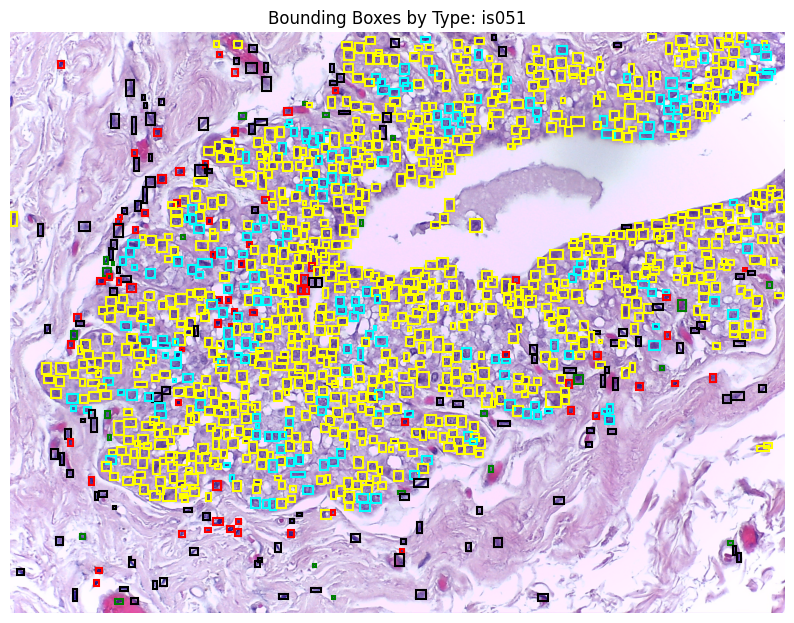

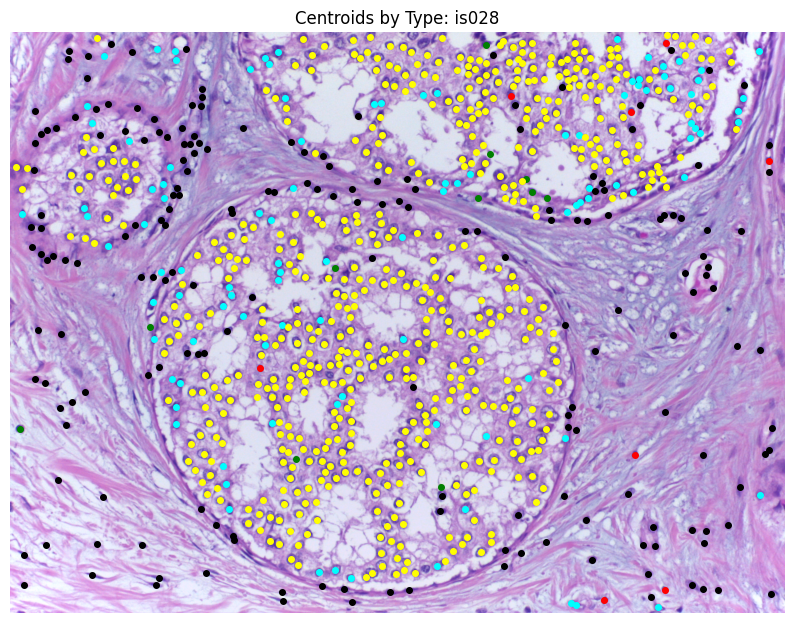

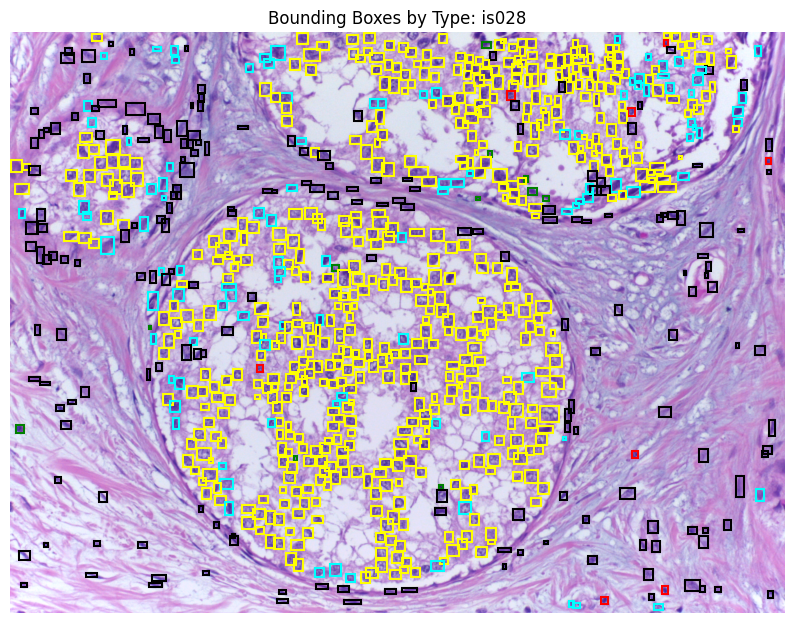

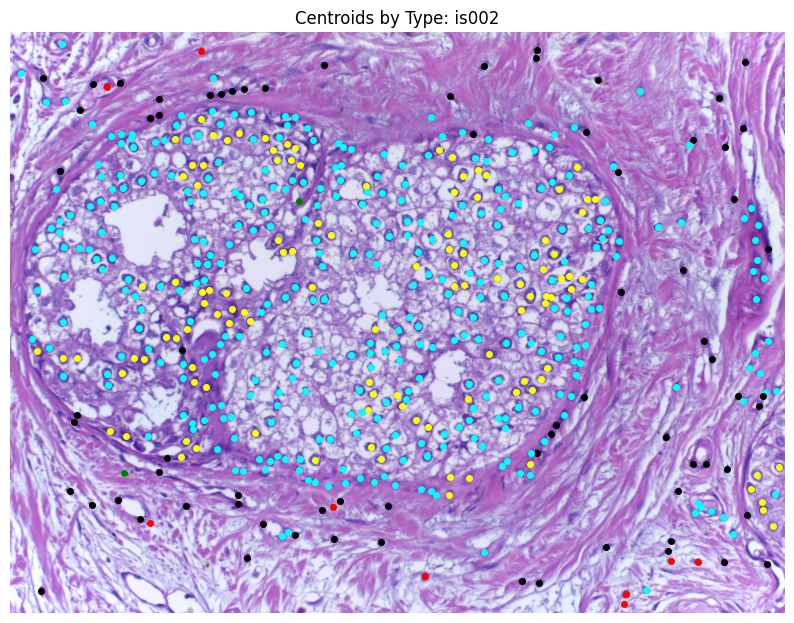

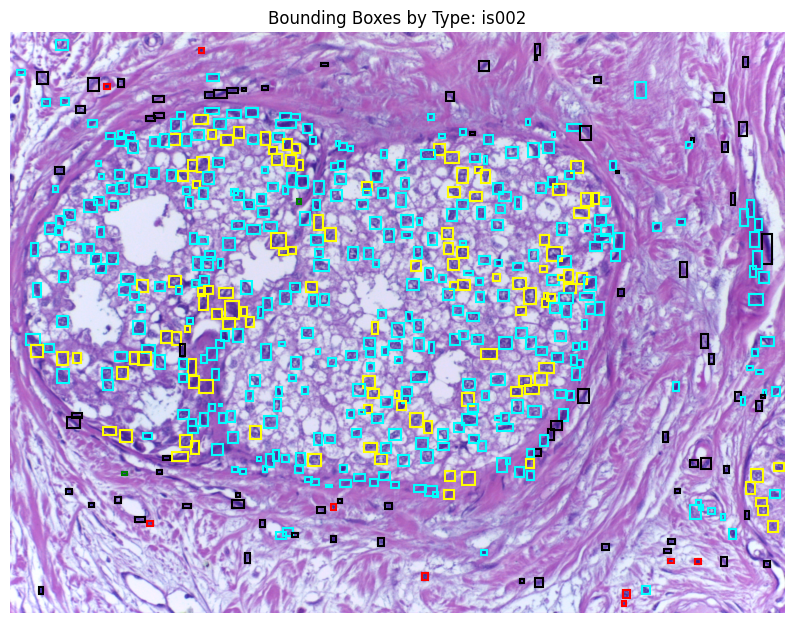

In [1]:
import os
import random
import joblib
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
from PIL import Image
from natsort import natsorted

# Define color map for nucleus types
type_colors = {
    0: 'blue',
    1: 'yellow',
    2: 'red',
    3: 'black',
    4: 'green',
    5: 'aqua'
}
def plot_nuclei_centroids_and_boxes_by_type(image_folder, dat_folder, num_images=5):
    image_paths = natsorted(glob(os.path.join(image_folder, "*.tif")))
    selected_images = random.sample(image_paths, min(num_images, len(image_paths)))
    
    for image_path in selected_images:
        filename = os.path.splitext(os.path.basename(image_path))[0]
        idx = int(filename[-2:])
        dat_path = os.path.join(dat_folder, f"{idx-1}.dat")

        if not os.path.exists(dat_path):
            print(f"⚠️  DAT file not found for {filename}, skipping.")
            continue

        image = Image.open(image_path).convert("RGB")
        nuclei_data = joblib.load(dat_path)

        # ---------- Plot 1: Centroids ----------
        fig1, ax1 = plt.subplots(figsize=(10, 10))
        ax1.imshow(image)

        for nucleus in nuclei_data.values():
            if(nucleus['type']):
                x, y = nucleus['centroid']
                # print(nucleus)
                nucleus_type = nucleus['type']
                color = type_colors.get(nucleus_type, 'white')
                ax1.plot(x, y, 'o', color=color, markersize=4)

        ax1.set_title(f"Centroids by Type: {filename}")
        ax1.axis("off")

        # ---------- Plot 2: Bounding Boxes ----------
        fig2, ax2 = plt.subplots(figsize=(10, 10))
        ax2.imshow(image)

        for nucleus in nuclei_data.values():
            if nucleus['type']:
                contour = np.array(nucleus["contour"])
                nucleus_type = nucleus["type"]
                color = type_colors.get(nucleus_type, 'white')

                min_x, min_y = np.min(contour, axis=0)
                max_x, max_y = np.max(contour, axis=0)
                width, height = max_x - min_x, max_y - min_y
                rect = plt.Rectangle((min_x, min_y), width, height,
                                    edgecolor=color, facecolor='none', linewidth=1.5)
                ax2.add_patch(rect)
            else : continue  

        ax2.set_title(f"Bounding Boxes by Type: {filename}")
        ax2.axis("off")

        plt.show()

# Example usage
subtype = "InSitu"
image_folder = f"./dataset/data/Photos/{subtype}/"
dat_folder = f"./n_detected_pannuke/{subtype}/"
plot_nuclei_centroids_and_boxes_by_type(image_folder, dat_folder, num_images=5)

subtype = "Invasive"
image_folder = f"./dataset/{subtype}/"
dat_folder = f"./n_detected_pannuke/{subtype}/"

plot_nuclei_centroids_and_boxes_by_type(image_folder, dat_folder, num_images=5)